## Final Project : E503 : Multi-variate Time Series Forecasting - Air Pollution

### Importing required libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tqdm
from tqdm import tqdm
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Model
from sklearn.impute import SimpleImputer
plt.style.use('seaborn')
import warnings
warnings.filterwarnings('ignore')

/var/folders/cs/5kmxbmk966x4whvmdb68p4vr0000gn/T/ipykernel_69178/3450941222.py:17: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [3]:
# Load the CSV file into a DataFrame
data = pd.read_csv('AirQuality.csv', delimiter=';')

# Display the first few rows of the DataFrame
data.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN


In [4]:
# shape of our dataset
print("Number of rows in dataset:",data.shape[0])
print("Number of columns in dataset:",data.shape[1])

Number of rows in dataset: 9471
Number of columns in dataset: 17


In [5]:
# getting the names of the columns
data.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH', 'Unnamed: 15', 'Unnamed: 16'],
      dtype='object')

In [6]:
# getting the dtypes of the all columns
data.describe(include = "all")

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
count,9357,9357,9357,9357.000000,9357.000000,9357,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357,9357,9357,0.0,0.0
unique,391,24,104,NaN,NaN,408,NaN,NaN,NaN,NaN,NaN,NaN,437,754,6684,NaN,NaN
top,21/09/2004,18.00.00,-200,NaN,NaN,"-200,0",NaN,NaN,NaN,NaN,NaN,NaN,-200,-200,-200,NaN,NaN
freq,24,390,1592,NaN,NaN,366,NaN,NaN,NaN,NaN,NaN,NaN,366,366,366,NaN,NaN
mean,NaN,NaN,NaN,1048.990061,-159.090093,NaN,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,329.832710,139.789093,NaN,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,-200.000000,-200.000000,NaN,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,921.000000,-200.000000,NaN,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,1053.000000,-200.000000,NaN,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,1221.000000,-200.000000,NaN,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,NaN,NaN,NaN,NaN,NaN


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   object 
 13  RH             9357 non-null   object 
 14  AH             9357 non-null   object 
 15  Unnamed: 15    0 non-null      float64
 16  Unnamed: 16    0 non-null      float64
dtypes: float64(10), object(7)
memory usage: 1.2+ MB


In [8]:
# checking null values in our dataset
data.isnull().sum()

Date              114
Time              114
CO(GT)            114
PT08.S1(CO)       114
NMHC(GT)          114
C6H6(GT)          114
PT08.S2(NMHC)     114
NOx(GT)           114
PT08.S3(NOx)      114
NO2(GT)           114
PT08.S4(NO2)      114
PT08.S5(O3)       114
T                 114
RH                114
AH                114
Unnamed: 15      9471
Unnamed: 16      9471
dtype: int64

In [9]:
# Check for non-null values in the unnamed columns
non_null_values = data[['Unnamed: 15', 'Unnamed: 16']].dropna()

# Display any non-null values (if they exist)
non_null_values


,Unnamed: 15,Unnamed: 16


In [10]:
# Dropping the unnamed columns
data.drop(columns=['Unnamed: 15', 'Unnamed: 16'], inplace=True)

In [11]:
data.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

In [12]:
data.tail(114)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
9357,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9360,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9468,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# dropping the last 114 rows which are fully empty
data.dropna(inplace=True)

In [14]:
# Checking null values in our dataset
data.isnull().sum()

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

In [15]:
# Columns with comma as decimal separator
comma_decimal_columns = ['CO(GT)', 'C6H6(GT)', 'T', 'RH', 'AH']

# Replace comma with period and convert to float
for col in comma_decimal_columns:
    data[col] = data[col].str.replace(',', '.').astype(float)

# Display the cleaned data
data.head()


,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [16]:
# Combine Date and Time columns into a single datetime column
data['DateTime'] = pd.to_datetime(data['Date'] + ' ' + data['Time'], format='%d/%m/%Y %H.%M.%S')

# Drop the original Date and Time columns
data.drop(columns=['Date', 'Time'], inplace=True)

# Reorder the columns to have DateTime as the first column
column_order = ['DateTime'] + [col for col in data if col != 'DateTime']
data = data[column_order]

# Display the cleaned and restructured data
data.head()


,DateTime,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10 18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10 19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10 20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10 21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10 22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [17]:
# Replace -200 (placeholder for missing values) with NaN
data.replace(-200, np.nan, inplace=True)

In [18]:
data.isna().sum()

DateTime            0
CO(GT)           1683
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64

In [19]:
percent_NaN = []
columns = data.columns
for col in columns:
    pNaN =  (data[col].isna().sum()/data.shape[0]) * 100 #sum NaN instances in each column. Divide by total rows
    percent_NaN.append(pNaN)
nan_percent_df = pd.DataFrame(percent_NaN,
                              index=columns,
                              columns=['%_NaN_in_Column']).sort_values('%_NaN_in_Column',ascending = False)
print(nan_percent_df)

               %_NaN_in_Column
NMHC(GT)             90.231912
CO(GT)               17.986534
NO2(GT)              17.548360
NOx(GT)              17.516298
PT08.S1(CO)           3.911510
C6H6(GT)              3.911510
PT08.S2(NMHC)         3.911510
PT08.S3(NOx)          3.911510
PT08.S4(NO2)          3.911510
PT08.S5(O3)           3.911510
T                     3.911510
RH                    3.911510
AH                    3.911510
DateTime              0.000000


In [20]:
data.drop('NMHC(GT)', axis=1, inplace=True, errors = 'ignore')
data = data.dropna()
data.head()

,DateTime,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10 18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10 19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10 20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10 21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10 22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6941 entries, 0 to 9356
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   DateTime       6941 non-null   datetime64[ns]
 1   CO(GT)         6941 non-null   float64       
 2   PT08.S1(CO)    6941 non-null   float64       
 3   C6H6(GT)       6941 non-null   float64       
 4   PT08.S2(NMHC)  6941 non-null   float64       
 5   NOx(GT)        6941 non-null   float64       
 6   PT08.S3(NOx)   6941 non-null   float64       
 7   NO2(GT)        6941 non-null   float64       
 8   PT08.S4(NO2)   6941 non-null   float64       
 9   PT08.S5(O3)    6941 non-null   float64       
 10  T              6941 non-null   float64       
 11  RH             6941 non-null   float64       
 12  AH             6941 non-null   float64       
dtypes: datetime64[ns](1), float64(12)
memory usage: 759.2 KB


### Since the data is real valued, we should replace all the null values with mean of each column

In [22]:
# col = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)','PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)','PT08.S5(O3)', 'T', 'RH', 'AH']
# data = data[col]
# data[col].dtypes

In [23]:
for i in data:
    data[i] = data[i].fillna(data[i].mean())

In [24]:
data.isnull().sum()

DateTime         0
CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

In [25]:
data.head()

,DateTime,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10 18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10 19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10 20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10 21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10 22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


### Handling Outliers

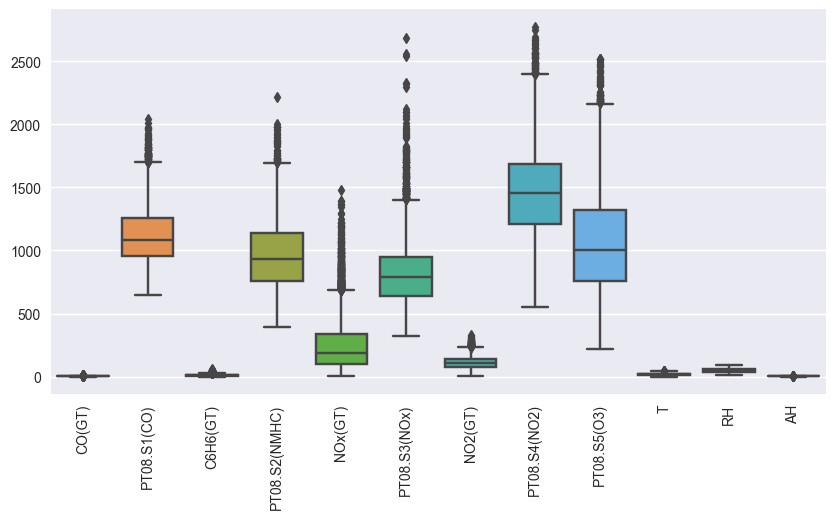

In [26]:
# plotting a boxplot
plt.figure(figsize=(10,5))
sns.boxplot(data=data)
plt.xticks(rotation='vertical')
plt.show()

Outliers are extreme values that stand out greatly from the overall pattern of values in a dataset.

It is necessary to handle outliers because they affect the model's distribution and ultimately the model's accuracy.

We can use boxplot to get an idea of the outliers present in the dataset.

The box represents the interquartile range (IQR), with the median indicated by a line inside the box.

Any points outside the whiskers are considered potential outliers.

In [27]:
numerical_columns = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)','PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)','PT08.S5(O3)', 'T', 'RH', 'AH']

In [28]:
df = data[numerical_columns]

In [29]:
# Detecting outliers using IQR
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

In [30]:
outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).sum()
print(f'Number of outliers in each column:\n{outliers}')

Number of outliers in each column:
CO(GT)           191
PT08.S1(CO)       89
C6H6(GT)         160
PT08.S2(NMHC)     46
NOx(GT)          354
PT08.S3(NOx)     182
NO2(GT)           90
PT08.S4(NO2)      58
PT08.S5(O3)       56
T                  8
RH                 0
AH                22
dtype: int64


In [31]:
mask = (df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))
mask

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
9352,False,False,False,False,False,False,False,False,False,False,False,False
9353,False,False,False,False,False,False,False,False,False,False,False,False
9354,False,False,False,False,False,False,False,False,False,False,False,False
9355,False,False,False,False,False,False,False,False,False,False,False,False


In [32]:
# now replacing all the outliers using the median of that particular column
for i in mask.columns:
    df[i].astype('float')
    temp = df[i].median()
    df.loc[mask[i], i] = temp

In [33]:
# outliers are now being handled and are replaced with that column's median value
((df[numerical_columns] < (Q1 - 1.5 * IQR)) | (df[numerical_columns] > (Q3 + 1.5 * IQR))).sum()

CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

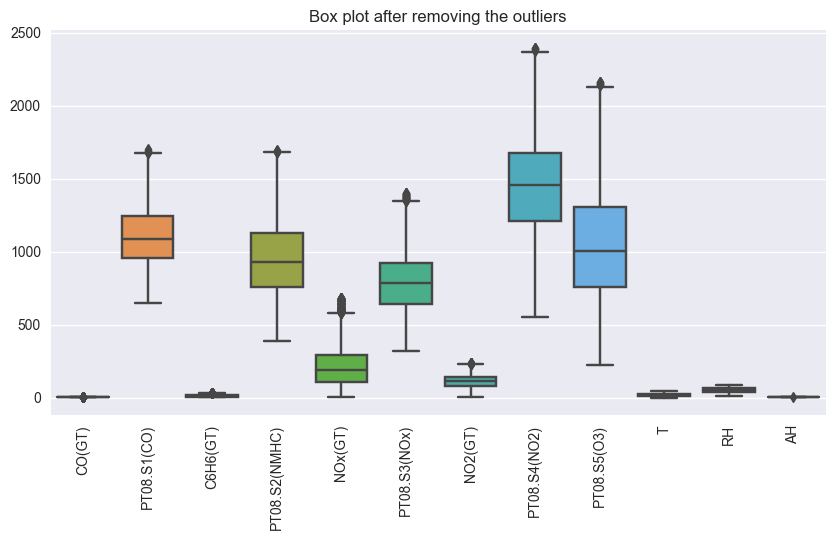

In [34]:
plt.figure(figsize=(10,5))
sns.boxplot(data=df)
plt.xticks(rotation='vertical')
plt.title('Box plot after removing the outliers')
plt.show()

### Checking if there are any categorical features and if there are any, we have to convert them to numerical features

In [35]:
df.dtypes

CO(GT)           float64
PT08.S1(CO)      float64
C6H6(GT)         float64
PT08.S2(NMHC)    float64
NOx(GT)          float64
PT08.S3(NOx)     float64
NO2(GT)          float64
PT08.S4(NO2)     float64
PT08.S5(O3)      float64
T                float64
RH               float64
AH               float64
dtype: object

#### As we can see above, there aren't any categorical featutres in our dataset

# Exploratory Data Analysis and Visualization

In [36]:
# using pearson's correlation to find the correlation between all the features
df.corr()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.810697,0.866790,0.850195,0.633051,-0.687801,0.635611,0.556991,0.782181,0.047930,0.021564,0.057393
PT08.S1(CO),0.810697,1.000000,0.820084,0.851557,0.575454,-0.751999,0.603619,0.630528,0.862203,0.035286,0.161618,0.153534
C6H6(GT),0.866790,0.820084,1.000000,0.923399,0.553576,-0.711799,0.577850,0.705353,0.802455,0.213345,-0.056935,0.182002
PT08.S2(NMHC),0.850195,0.851557,0.923399,1.000000,0.575558,-0.760920,0.615175,0.740083,0.847726,0.235719,-0.059329,0.206862
NOx(GT),0.633051,0.575454,0.553576,0.575558,1.000000,-0.640865,0.663508,0.123793,0.650630,-0.230311,0.168956,-0.126084
PT08.S3(NOx),-0.687801,-0.751999,-0.711799,-0.760920,-0.640865,1.000000,-0.609393,-0.470190,-0.783919,-0.048707,-0.150844,-0.198299
NO2(GT),0.635611,0.603619,0.577850,0.615175,0.663508,-0.609393,1.000000,0.129593,0.671314,-0.185165,-0.096993,-0.323798
PT08.S4(NO2),0.556991,0.630528,0.705353,0.740083,0.123793,-0.470190,0.129593,1.000000,0.538373,0.582925,-0.019116,0.651475
PT08.S5(O3),0.782181,0.862203,0.802455,0.847726,0.650630,-0.783919,0.671314,0.538373,1.000000,-0.037112,0.163382,0.091604
T,0.047930,0.035286,0.213345,0.235719,-0.230311,-0.048707,-0.185165,0.582925,-0.037112,1.000000,-0.559456,0.660884


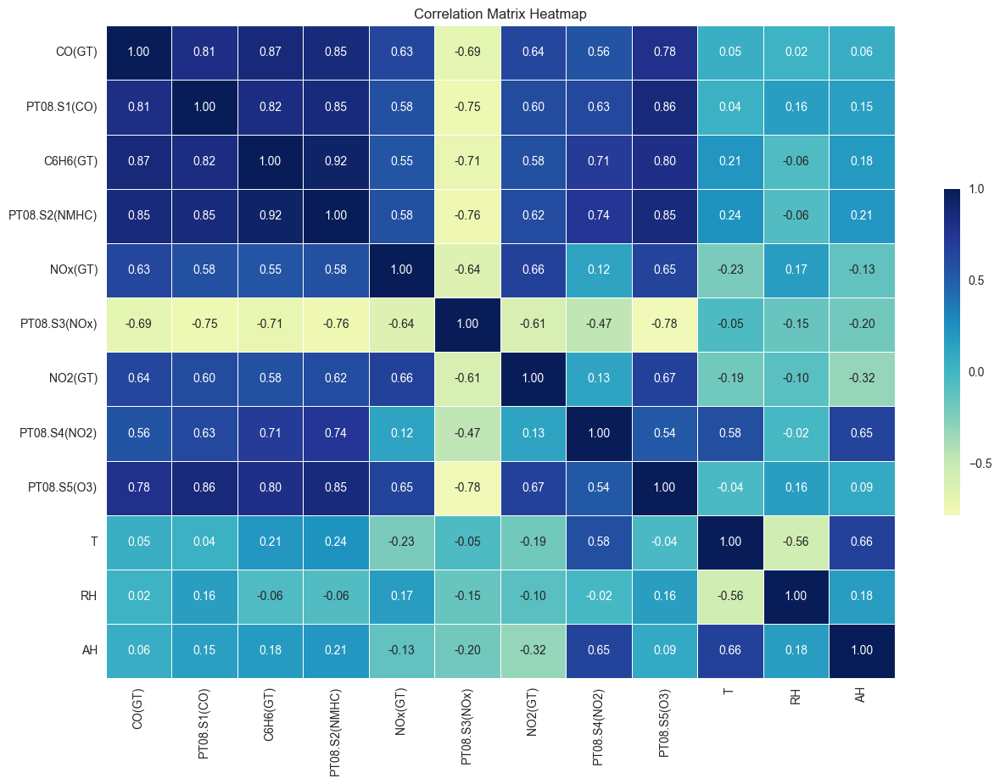

In [37]:
plt.figure(figsize=(15, 10))

sns.heatmap(df.corr(), cmap='YlGnBu',center=0,annot=True,fmt='.2f',linewidths=0.5,
            cbar_kws={'shrink': 0.5, 'ticks': [-1, -0.5, 0, 0.5, 1]} )
plt.title('Correlation Matrix Heatmap')
plt.show()

In [38]:
sns.pairplot(df)

# Adjust the plot aesthetics
sns.set(font_scale=1.2)
plt.subplots_adjust(top=0.95)

# Add a title to the plot
plt.suptitle('Pair Plot of the Dataset', fontsize=18)

# Show the plot
plt.show()

In [39]:
def summary_plot(dataset, period='M'):
    summary = dataset.resample(period).mean()  # 'M' stands for month-end frequency

    summary.plot(kind='line', figsize=(15, 8))
    plt.title('Summary Plot')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.show()

In [40]:
# Convert the 'Date' column to datetime if it's not already the index
data['DateTime'] = pd.to_datetime(data['DateTime'])
data.set_index('DateTime', inplace=True)

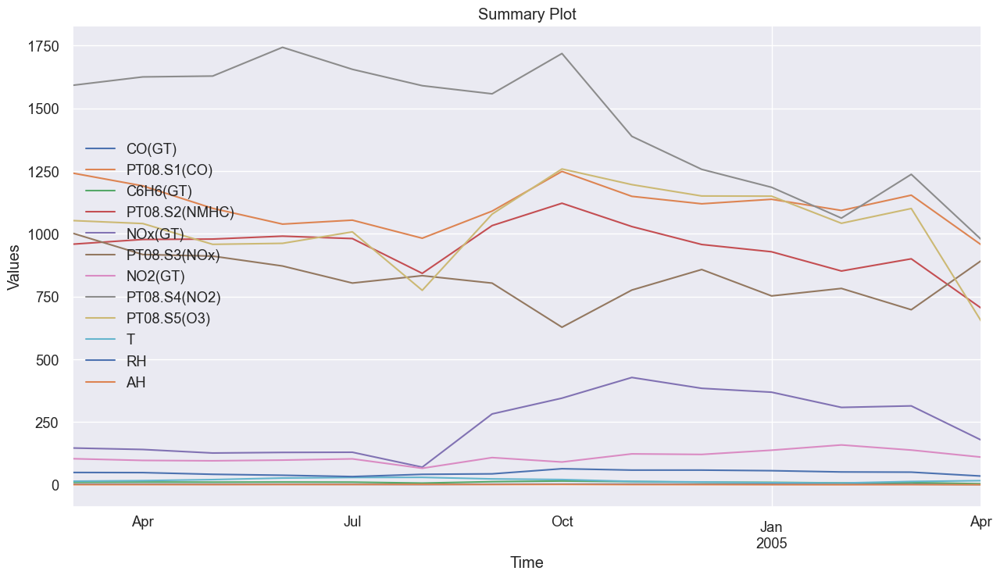

In [41]:
summary_plot(data, period='M')

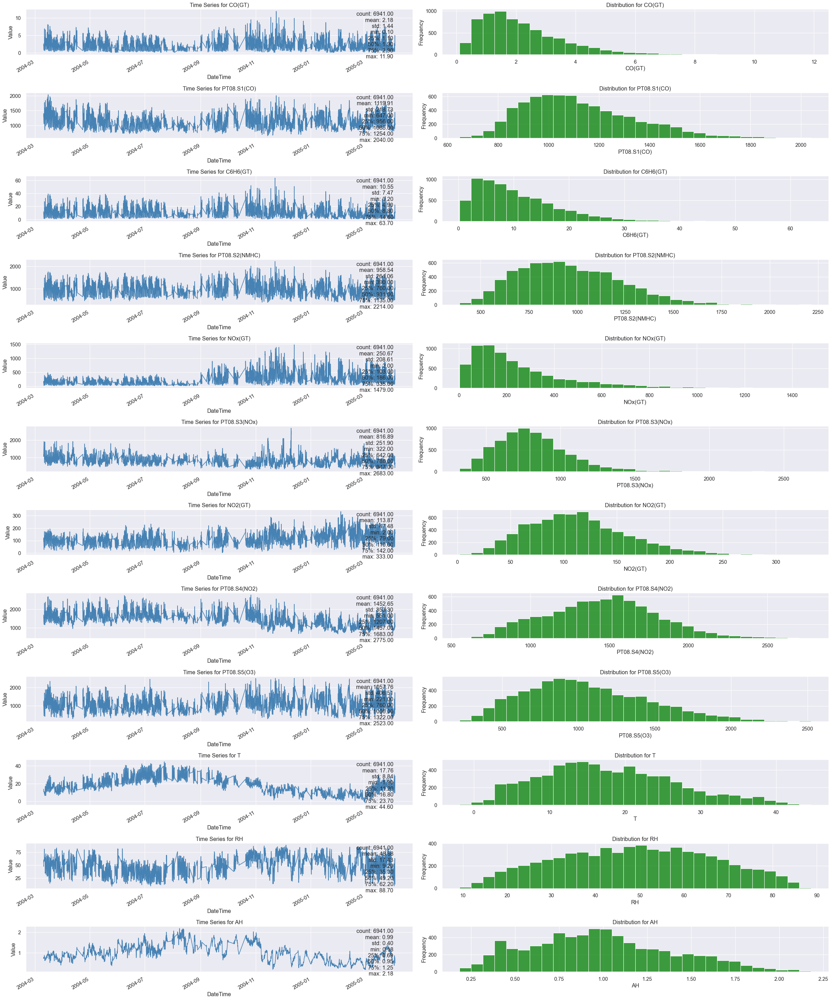

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def trend_level_plots(dataset):
    # Determine the number of numerical columns for plotting (excluding datetime index)
    num_columns = len(dataset.select_dtypes(include=[np.number]).columns)

    # Create the figure with a subplot for each numerical column
    fig, axes = plt.subplots(nrows=num_columns, ncols=2, figsize=(30, 3 * num_columns), dpi=80)

    # Loop over each numerical column and create the line and histogram plots
    for i, column in enumerate(dataset.select_dtypes(include=[np.number]).columns):
        # Line plot for the time series data
        dataset[column].plot(ax=axes[i, 0], color='steelblue')
        axes[i, 0].set_title(f'Time Series for {column}')
        axes[i, 0].set_ylabel('Value')

        # Histogram for the distribution
        sns.histplot(dataset[column], bins=30, kde=False, ax=axes[i, 1], color='green')
        axes[i, 1].set_title(f'Distribution for {column}')
        axes[i, 1].set_ylabel('Frequency')

        # Summary statistics as text in the line plot
        summary_stats = dataset[column].describe()
        stats_text = '\n'.join([f'{stat}: {value:.2f}' for stat, value in summary_stats.items()])
        axes[i, 0].text(0.95, 0.95, stats_text, transform=axes[i, 0].transAxes, verticalalignment='top', horizontalalignment='right')

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Usage:
trend_level_plots(data)


In [43]:
def time_variation_plot(dataset, pollutant, title):
    # Determine the number of unique days in the data
    days = dataset.index.dayofweek.unique()
    num_days = len(days)

    # Create the figure with a subplot for each day
    fig, axes = plt.subplots(num_days, 1, figsize=(15, 3 * num_days), constrained_layout=True)
    fig.suptitle(title, fontsize=16)

    # Plot time series for each day
    for i, day in enumerate(days):
        daily_data = dataset[dataset.index.dayofweek == day]
        sns.lineplot(x=daily_data.index.hour, y=daily_data[pollutant], ci=95, ax=axes[i], color='blue')
        axes[i].set_title('Day ' + str(day) + ' Hourly Trend')
        axes[i].set_xlabel('Hour of Day')
        axes[i].set_ylabel(pollutant)

    plt.show()

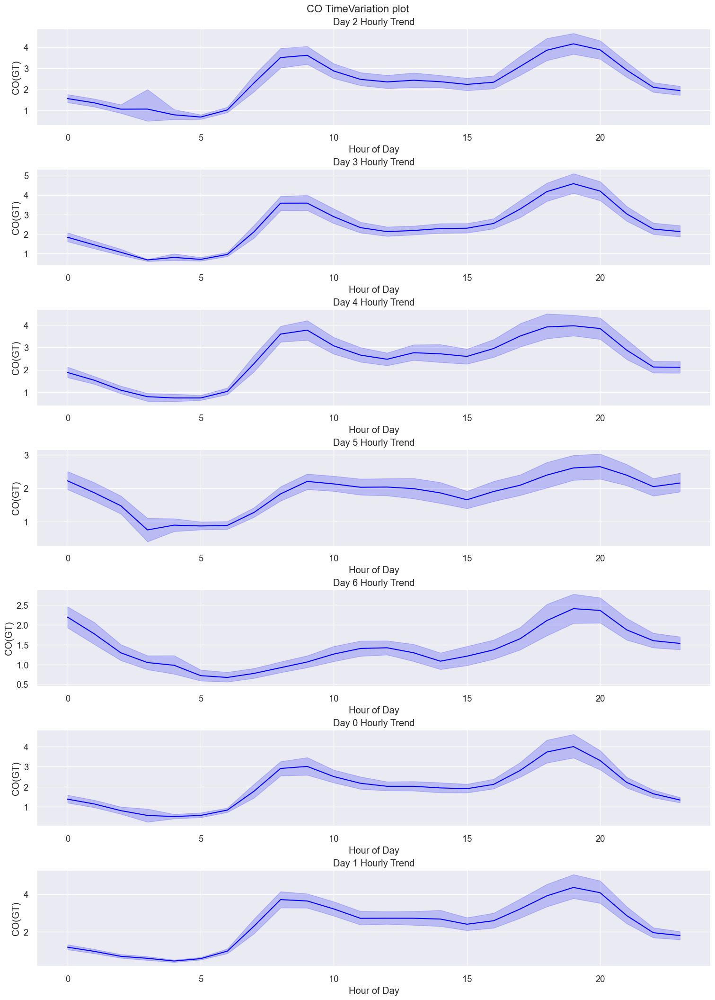

In [44]:
time_variation_plot(data, 'CO(GT)', 'CO TimeVariation plot')

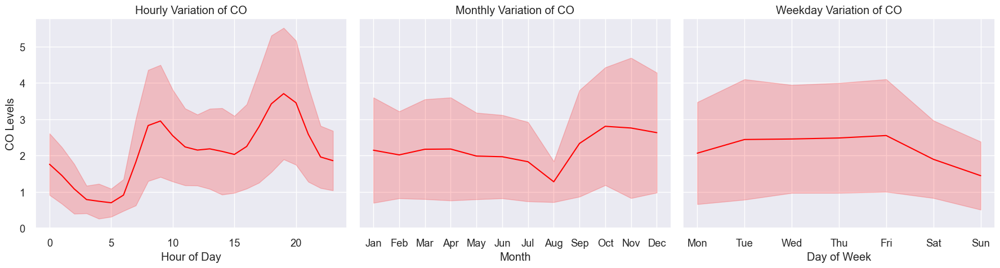

In [45]:
# Set up the matplotlib figure
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Hourly variation plot
sns.lineplot(x=data.index.hour, y=data['CO(GT)'], ci='sd', ax=axes[0], color='red')
axes[0].set_title('Hourly Variation of CO')
axes[0].set_xlabel('Hour of Day')
axes[0].set_ylabel('CO Levels')

# Monthly variation plot
sns.lineplot(x=data.index.month, y=data['CO(GT)'], ci='sd', ax=axes[1], color='red')
axes[1].set_title('Monthly Variation of CO')
axes[1].set_xlabel('Month')
axes[1].set_xticks(range(1, 13))
axes[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Weekday variation plot
sns.lineplot(x=data.index.weekday, y=data['CO(GT)'], ci='sd', ax=axes[2], color='red')
axes[2].set_title('Weekday Variation of CO')
axes[2].set_xlabel('Day of Week')
axes[2].set_xticks(range(7))
axes[2].set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

# Adjust layout for tight fit and display the plot
plt.tight_layout()
plt.show()


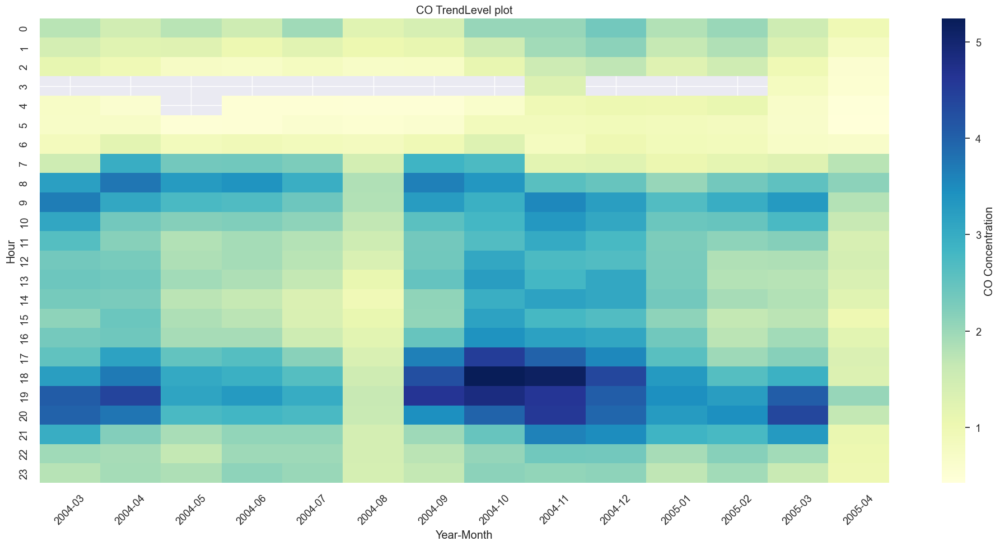

In [46]:
# Extracting year, month, and hour from the index (DateTimeIndex)
data['Year'] = data.index.year
data['Month'] = data.index.month
data['Hour'] = data.index.hour

# Creating a 'Year-Month' column for proper grouping
data['Year-Month'] = data['Year'].astype(str) + '-' + data['Month'].astype(str).str.zfill(2)

# Pivot the data to get 'Hour' as the rows and 'Year-Month' as the columns
heatmap_data = data.pivot_table(values='CO(GT)', index='Hour', columns='Year-Month', aggfunc='mean')

# Sorting the columns to ensure they are in the correct order
heatmap_data = heatmap_data.reindex(sorted(heatmap_data.columns), axis=1)

# Plotting the heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(heatmap_data, cmap="YlGnBu", cbar_kws={'label': 'CO Concentration'})
plt.title('CO TrendLevel plot')
plt.xlabel('Year-Month')
plt.ylabel('Hour')
plt.xticks(rotation=45)  # Rotate the x labels to fit them better
plt.tight_layout()  # Adjust layout
plt.show()


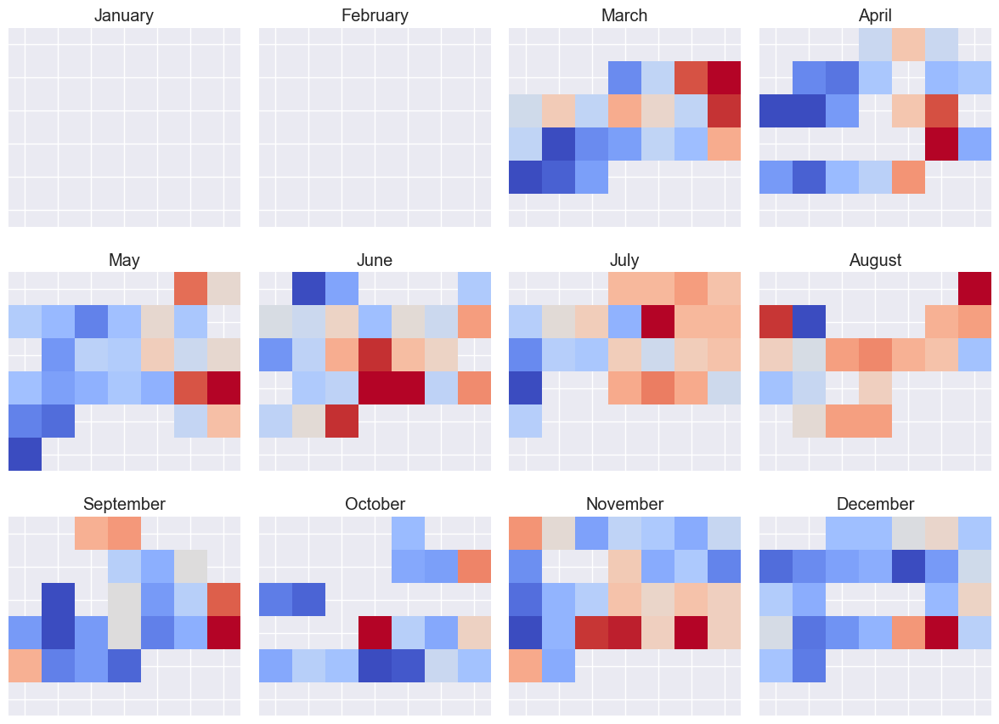

In [47]:
import calendar
def create_monthly_calendar(year, month, data, ax, pollutant):
    # Create a matrix for the days of the month
    max_day = calendar.monthrange(year, month)[1]
    month_matrix = np.full((6, 7), np.nan)  # 6 weeks, 7 days a week

    # Fill the matrix with the pollutant data
    for day in range(1, max_day + 1):
        day_index = pd.Timestamp(year=year, month=month, day=day)
        weekday = day_index.weekday()
        week_of_month = (day + calendar.monthrange(year, month)[0] - 1) // 7
        if day_index in data.index:
            month_matrix[week_of_month, weekday] = data.loc[day_index, pollutant]

    # Plot the matrix as a heatmap
    sns.heatmap(month_matrix, ax=ax, cmap='coolwarm', square=True, cbar=False)
    ax.set_title(calendar.month_name[month])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 9))  # for a full year calendar
for month, ax in enumerate(axes.flatten(), 1):
    create_monthly_calendar(2004, month, data, ax, 'CO(GT)')

plt.tight_layout()
plt.show()

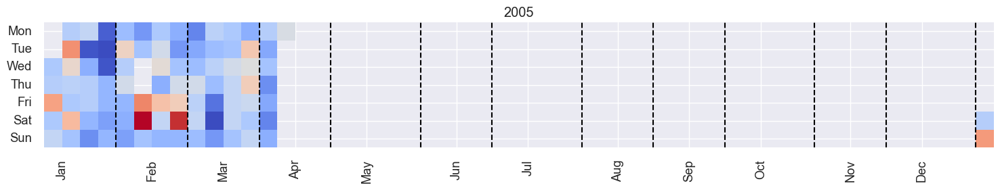

In [48]:
import calendar

def create_calendar_heatmap(year, data, pollutant, ax):
    # Month and day labels
    month_labels = [calendar.month_abbr[i] for i in range(1, 13)]
    day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

    # Initialize the day grid with NaN values
    day_grid = np.nan * np.zeros((7, 53))  # 7 days, up to 53 weeks

    for month in range(1, 13):
        month_data = data.loc[(data.index.year == year) & (data.index.month == month), pollutant]
        for day in month_data.index:
            week_of_year = day.isocalendar()[1] - 1  # Subtract 1 for zero-indexed array
            day_of_week = day.weekday()  # Monday=0, Sunday=6
            day_grid[day_of_week, week_of_year] = month_data[day]

    # Plot the heatmap
    sns.heatmap(day_grid, mask=np.isnan(day_grid), ax=ax, square=True, cbar=False, cmap='coolwarm')
    ax.set_title(f'{year}')
    ax.set_yticklabels(day_labels, rotation=0)
    ax.set_xticklabels([])

    # Add month separators
    for month in range(1, 13):
        month_start = pd.Timestamp(year=year, month=month, day=1)
        week_of_year = month_start.isocalendar()[1] - 1
        ax.axvline(x=week_of_year, color='black', linestyle='--')

    ax.set_xticks([pd.Timestamp(year=year, month=m, day=15).isocalendar()[1] - 1 for m in range(1, 13)])
    ax.set_xticklabels(month_labels, rotation=90)

# Usage example
fig, ax = plt.subplots(figsize=(15, 5))
create_calendar_heatmap(2005, data, 'CO(GT)', ax)
plt.tight_layout()
plt.show()


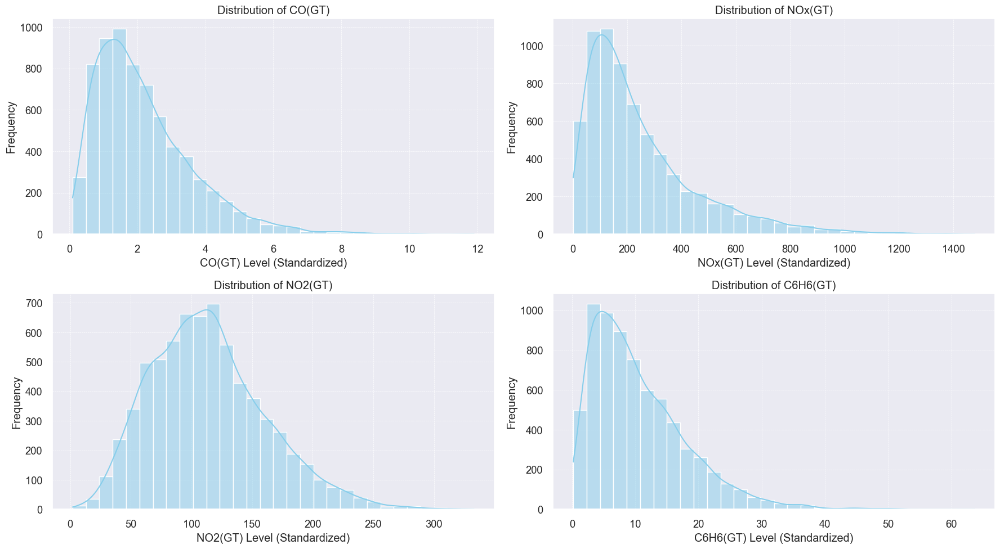

In [49]:
# Distribution of Major Pollutants
pollutants = ['CO(GT)', 'NOx(GT)', 'NO2(GT)', 'C6H6(GT)']

plt.figure(figsize=(18, 10))

for i, pollutant in enumerate(pollutants, 1):
    plt.subplot(2, 2, i)
    sns.histplot(data[pollutant], bins=30, color='skyblue', kde=True)
    plt.title(f'Distribution of {pollutant}')
    plt.xlabel(f'{pollutant} Level (Standardized)')
    plt.ylabel('Frequency')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


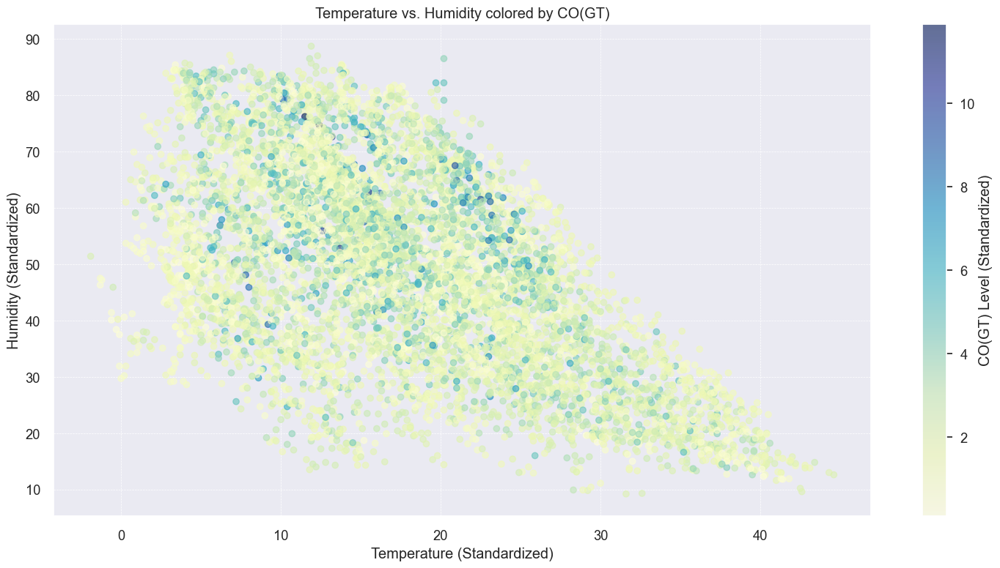

In [50]:
# Scatter Plot of Temperature vs. Humidity colored by CO(GT)
plt.figure(figsize=(15, 8))
scatter = plt.scatter(data['T'], data['RH'], c=data['CO(GT)'], cmap='YlGnBu', alpha=0.6)
plt.colorbar(scatter, label='CO(GT) Level (Standardized)')
plt.title('Temperature vs. Humidity colored by CO(GT)')
plt.xlabel('Temperature (Standardized)')
plt.ylabel('Humidity (Standardized)')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


## **Multi-variate Time Series Analysis**

### **LSTM (Long Short-Term Memory) Neural Networks**

In [52]:
!pip3 install scikeras

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 8.0 MB/s eta 0:00:009.1 MB/s eta 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [53]:
!pip3 install keras-tuner


Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 1.8 MB/s eta 0:00:00 MB/s eta 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [54]:
import tensorflow as tf
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.models import Sequential
from scikeras.wrappers import KerasRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras_tuner import RandomSearch

In [55]:
features = df[['PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']]
target = df['PT08.S3(NOx)']

In [56]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features.values, target.values, test_size=0.2, random_state=42)

In [57]:
# Normalize the data
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [58]:
# Reshape the data to a 3D tensor [Batchsize, timestamps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

In [59]:
# Define a function to create the LSTM model with hyperparameters
def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=256, step=32),
                   return_sequences=True,
                   input_shape=(X_train.shape[1], X_train.shape[2])))
    for i in range(hp.Int('layers', 1, 3)):  # Number of additional LSTM layers
        model.add(LSTM(units=hp.Int(f'lstm_{i}_units', min_value=32, max_value=256, step=32),
                       return_sequences=True))
    model.add(Dropout(rate=hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(1))

    model.compile(optimizer=hp.Choice('optimizer', ['adam', 'rmsprop']),
                  loss='mean_squared_error')
    return model

In [60]:
# Initialize the tuner
tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=5,  # Set the number of trials for hyperparameter search
    executions_per_trial=3,  # Set the number of models that should be built and fit for each trial
    directory='my_dir',  # Directory to save logs and models
    project_name='air_quality_lstm'
)

# Perform hyperparameter tuning
tuner.search(X_train, y_train, epochs=5, validation_split=0.2)

Trial 5 Complete [00h 00m 14s]
val_loss: 493298.2916666667

Best val_loss So Far: 493298.2916666667
Total elapsed time: 00h 01m 45s


In [61]:
# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [62]:
print(best_hps)

In [63]:
# Train the best model
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=250, batch_size=32)

Epoch 1/250
174/174 [==============================] - 2s 3ms/step - loss: 641592.5000
Epoch 2/250
174/174 [==============================] - 1s 3ms/step - loss: 582468.3750
Epoch 3/250
174/174 [==============================] - 1s 3ms/step - loss: 542686.1250
Epoch 4/250
174/174 [==============================] - 1s 3ms/step - loss: 507135.5000
Epoch 5/250
174/174 [==============================] - 1s 3ms/step - loss: 473853.6875
Epoch 6/250
174/174 [==============================] - 1s 3ms/step - loss: 442879.6250
Epoch 7/250
174/174 [==============================] - 1s 3ms/step - loss: 413788.9688
Epoch 8/250
174/174 [==============================] - 1s 3ms/step - loss: 386086.6562
Epoch 9/250
174/174 [==============================] - 1s 3ms/step - loss: 359813.7812
Epoch 10/250
174/174 [==============================] - 1s 4ms/step - loss: 335375.9688
Epoch 11/250
174/174 [==============================] - 1s 4ms/step - loss: 312439.6562
Epoch 12/250
174/174 [===================

Epoch 95/250
174/174 [==============================] - 1s 4ms/step - loss: 46735.3516
Epoch 96/250
174/174 [==============================] - 1s 4ms/step - loss: 46679.2070
Epoch 97/250
174/174 [==============================] - 1s 4ms/step - loss: 46856.4492
Epoch 98/250
174/174 [==============================] - 1s 4ms/step - loss: 46858.3320
Epoch 99/250
174/174 [==============================] - 1s 4ms/step - loss: 46975.0898
Epoch 100/250
174/174 [==============================] - 1s 4ms/step - loss: 46861.1172
Epoch 101/250
174/174 [==============================] - 1s 4ms/step - loss: 46792.0273
Epoch 102/250
174/174 [==============================] - 1s 4ms/step - loss: 46854.7578
Epoch 103/250
174/174 [==============================] - 1s 4ms/step - loss: 46817.6094
Epoch 104/250
174/174 [==============================] - 1s 4ms/step - loss: 46852.7344
Epoch 105/250
174/174 [==============================] - 1s 4ms/step - loss: 46964.6250
Epoch 106/250
174/174 [==============

174/174 [==============================] - 1s 3ms/step - loss: 46751.4219
Epoch 189/250
174/174 [==============================] - 1s 4ms/step - loss: 46890.1719
Epoch 190/250
174/174 [==============================] - 1s 4ms/step - loss: 46821.4570
Epoch 191/250
174/174 [==============================] - 1s 4ms/step - loss: 46824.2031
Epoch 192/250
174/174 [==============================] - 1s 4ms/step - loss: 46849.9609
Epoch 193/250
174/174 [==============================] - 1s 4ms/step - loss: 46782.3555
Epoch 194/250
174/174 [==============================] - 1s 4ms/step - loss: 46793.5508
Epoch 195/250
174/174 [==============================] - 1s 3ms/step - loss: 46798.0039
Epoch 196/250
174/174 [==============================] - 1s 4ms/step - loss: 46798.9844
Epoch 197/250
174/174 [==============================] - 1s 4ms/step - loss: 46826.3398
Epoch 198/250
174/174 [==============================] - 1s 4ms/step - loss: 46792.1016
Epoch 199/250
174/174 [=======================

In [64]:
# Make predictions
y_pred = model.predict(X_test)

44/44 [==============================] - 0s 1ms/step


In [65]:
y_pred

array([[[792.9953 ]],

       [[795.47906]],

       [[793.1626 ]],

       ...,

       [[788.32947]],

       [[786.3045 ]],

       [[792.37305]]], dtype=float32)

In [66]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Predictions
y_pred = model.predict(X_test).flatten()

# MSE
mse = mean_squared_error(y_test, y_pred.flatten())
print(f'Mean Squared Error: {mse}')

# MAE
mae = mean_absolute_error(y_test, y_pred)
print(f'Mean Absolute Error (MAE): {mae}')

# RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'Root Mean Squared Error (RMSE): {rmse}')

44/44 [==============================] - 0s 1ms/step
Mean Squared Error: 41167.65257869076
Mean Absolute Error (MAE): 160.86316146466095
Root Mean Squared Error (RMSE): 202.89813350223494


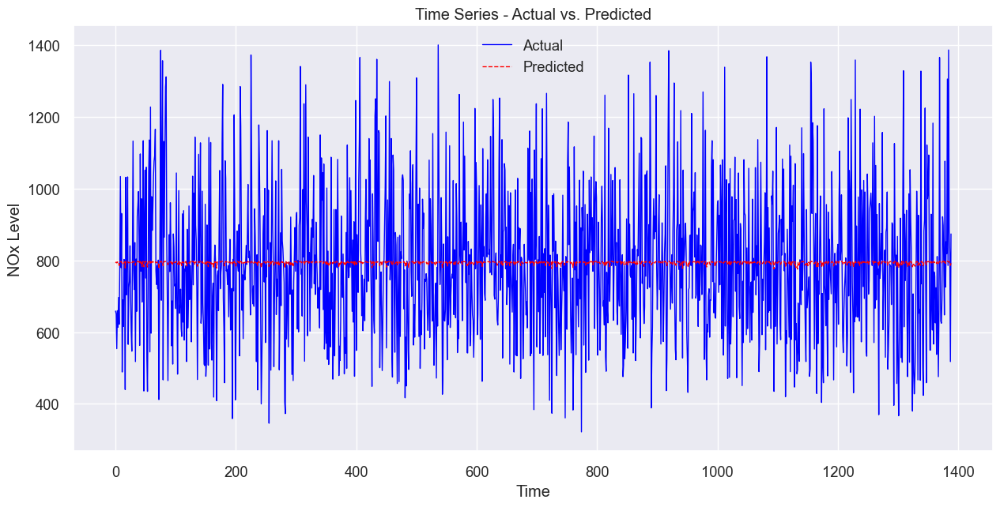

In [67]:
# Plot actual vs predicted values
plt.figure(figsize=(15, 7))
plt.plot(y_test, label='Actual', color='blue', linewidth=1)
plt.plot(y_pred, label='Predicted', color='red', linestyle='--', linewidth=1)
plt.title('Time Series - Actual vs. Predicted')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.legend()
plt.show()

In [ ]:
#pip install pmdarima

In [ ]:
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.tsa.api as smt
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [ ]:
import pmdarima as pm
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Assuming data is already split into X_train, X_test, y_train, y_test
# Use auto_arima to find the best SARIMA parameters
smodel = pm.auto_arima(y_train, exogenous=X_train,
                       start_p=1, start_q=1,
                       test='adf',
                       max_p=3, max_q=3, m=12,
                       start_P=0, seasonal=True,
                       d=None, D=1, trace=True,
                       error_action='ignore',
                       suppress_warnings=True,
                       stepwise=True)

print(smodel.summary())

# Fit the SARIMA model
sarima_model = SARIMAX(y_train, exogenous=X_train,
                       order=smodel.order,
                       seasonal_order=smodel.seasonal_order).fit()

# Predict on test set
y_pred_sarima = sarima_model.predict(start=len(y_train), end=len(y_train)+len(y_test)-1, exog=X_test)

# Calculate metrics
mse_sarima = mean_squared_error(y_test, y_pred_sarima)
print(f'SARIMA MSE: {mse_sarima}')


Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=20.89 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=78841.902, Time=0.39 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=77240.668, Time=15.55 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=19.24 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=78839.928, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=78841.598, Time=0.99 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=76674.766, Time=31.98 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=65.32 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=21.02 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=76679.241, Time=20.00 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=76676.761, Time=49.67 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=76676.754, Time=40.36 sec


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from keras_tuner import RandomSearch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Function to create GRU model for Keras Tuner
def build_gru_model(hp):
    model = Sequential()
    model.add(GRU(units=hp.Int('units', min_value=32, max_value=256, step=32),
                  return_sequences=True,
                  input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(rate=hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(GRU(units=hp.Int('units', min_value=32, max_value=256, step=32)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Initialize the GRU tuner
gru_tuner = RandomSearch(
    build_gru_model,
    objective='val_loss',
    max_trials=5,
    executions_per_trial=3,
    directory='my_dir',
    project_name='air_quality_gru'
)

Trial 5 Complete [00h 00m 40s]
val_loss: 626272.75

Best val_loss So Far: 394323.5208333333
Total elapsed time: 00h 05m 05s
Epoch 1/250
139/139 [==============================] - 8s 21ms/step - loss: 624161.8125 - val_loss: 584472.6875
Epoch 2/250
139/139 [==============================] - 2s 16ms/step - loss: 552692.4375 - val_loss: 528993.9375
Epoch 3/250
139/139 [==============================] - 2s 16ms/step - loss: 501198.8438 - val_loss: 480423.2812
Epoch 4/250
139/139 [==============================] - 2s 18ms/step - loss: 455153.0000 - val_loss: 436394.6875
Epoch 5/250
139/139 [==============================] - 4s 29ms/step - loss: 413190.7500 - val_loss: 396142.7500
Epoch 6/250
139/139 [==============================] - 2s 16ms/step - loss: 374735.0000 - val_loss: 359228.5000
Epoch 7/250
139/139 [==============================] - 2s 17ms/step - loss: 339424.7812 - val_loss: 325255.5312
Epoch 8/250
139/139 [==============================] - 2s 15ms/step - loss: 307037.6875 - va

In [ ]:
# Perform hyperparameter tuning for GRU
gru_tuner.search(X_train, y_train, epochs=5, validation_split=0.2)

In [ ]:
# Get the best hyperparameters and build the model
best_hps_gru = gru_tuner.get_best_hyperparameters(num_trials=1)[0]
gru_model = gru_tuner.hypermodel.build(best_hps_gru)

In [ ]:
# Fit the GRU model with the best hyperparameters
gru_history = gru_model.fit(X_train, y_train, epochs=250, batch_size=32, validation_split=0.2)

In [ ]:
# Predict and calculate metrics for GRU model...
y_pred_gru = gru_model.predict(X_test)
mse_gru = mean_squared_error(y_test, y_pred_gru)
print(f'GRU MSE: {mse_gru}')


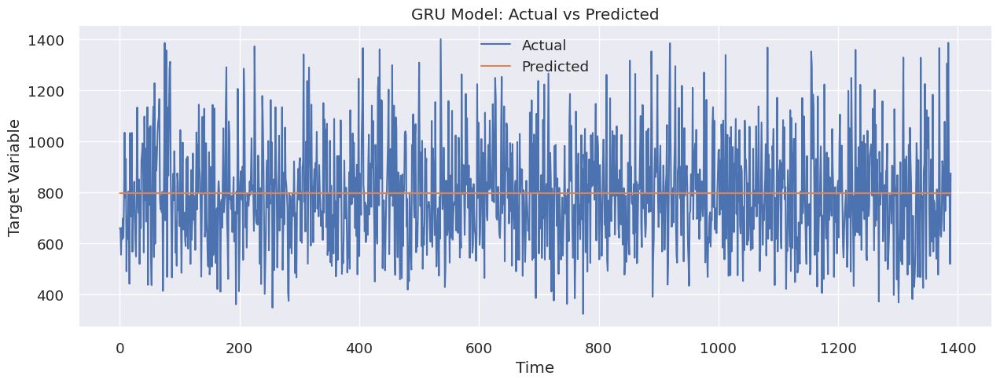

In [ ]:
# Here's how you would plot the actual vs predicted values over time

# Plot the actual vs predicted values
plt.figure(figsize=(15, 5))
plt.plot(y_test, label='Actual')
plt.plot(y_pred_gru, label='Predicted')
plt.title('GRU Model: Actual vs Predicted')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()

In [59]:
!pip install keras-tcn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 9.1 MB/s eta 0:00:00


In [66]:
from tcn import TCN
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from kerastuner.tuners import RandomSearch
from sklearn.metrics import mean_squared_error

# Model builder function
def build_model(hp):
    i = Input(shape=(X_train.shape[1], X_train.shape[2]))
    m = TCN(nb_filters=hp.Int('nb_filters', min_value=32, max_value=256, step=32),
            kernel_size=hp.Choice('kernel_size', values=[2, 3, 4]),
            nb_stacks=hp.Int('nb_stacks', min_value=1, max_value=3, step=1),
            dilations=[1, 2, 4, 8],
            padding='causal',
            use_skip_connections=True,
            dropout_rate=hp.Float('dropout_rate', min_value=0.0, max_value=0.5, step=0.1),
            return_sequences=False)(i)
    m = Dense(1)(m)
    model = Model(inputs=[i], outputs=[m])
    model.compile(optimizer=Adam(hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')),
                  loss='mean_squared_error')
    return model

In [67]:
# Initialize the tuner
tuner = RandomSearch(build_model,
                     objective='val_loss',
                     max_trials=5,
                     executions_per_trial=1,
                     directory='my_dir',
                     project_name='tcn_tuning')

Reloading Tuner from my_dir/tcn_tuning/tuner0.json


In [68]:
# Run the hyperparameter search
tuner.search(X_train, y_train,
             epochs=10,
             validation_split=0.2)

Trial 11 Complete [00h 00m 24s]
val_loss: 18597.96484375

Best val_loss So Far: 15356.18359375
Total elapsed time: 00h 11m 40s


In [69]:
# Get the best model and evaluate it
best_model = tuner.get_best_models(num_models=1)[0]


In [70]:
y_pred_tcn = best_model.predict(X_test)
mse_tcn = mean_squared_error(y_test, y_pred_tcn)
print(f'Best Model TCN MSE: {mse_tcn}')



44/44 [==============================] - 1s 5ms/step
Best Model TCN MSE: 16488.606967303225


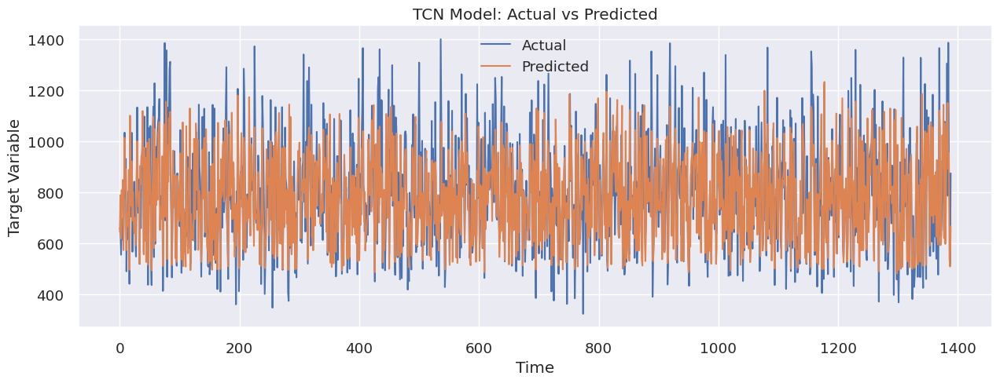

In [71]:
# Plot the actual vs predicted values
plt.figure(figsize=(15, 5))
plt.plot(y_test, label='Actual')
plt.plot(y_pred_tcn, label='Predicted')
plt.title('TCN Model: Actual vs Predicted')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()

In [73]:
from sklearn.metrics import mean_absolute_error, r2_score
# Calculate evaluation metrics
mse_tcn = mean_squared_error(y_test, y_pred_tcn)
mae_tcn = mean_absolute_error(y_test, y_pred_tcn)
r2_tcn = r2_score(y_test, y_pred_tcn)

print(f'TCN MSE: {mse_tcn}')
print(f'TCN MAE: {mae_tcn}')
print(f'TCN R²: {r2_tcn}')

TCN MSE: 16488.606967303225
TCN MAE: 93.59437432505399
TCN R²: 0.6095360719740588
